In [ ]:
import io
import itertools
from copy import deepcopy

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from PIL import Image
from transformers import AutoImageProcessor, SiglipForImageClassification

from src.data_utils import load_cleaned_dataset_part, perform_experiment
from src.data_preparation_pipeline import deduplicate_embeddings
from src.utils import plot_images

# Dataset sample

In [3]:
dataset_part = load_cleaned_dataset_part()

15:50:10 - data_utils - INFO - 	image: {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00\xb4\x00\xb4\x00\x00\xff\xdb\x00C\x00\x0...
15:50:10 - data_utils - INFO - 	image_url: https://upload.wikimedia.org/wikipedia/commons/8/8b/Scolopendra_gigantea.jpg
15:50:10 - data_utils - INFO - 	embedding: [1.4784087, 2.8710432, 0.0, 0.51603067, 1.3256501, 0.2642324, 0.0, 0.0, 1.1812905, 1.8753362, 9.4379...
15:50:10 - data_utils - INFO - 	metadata_url: http://commons.wikimedia.org/wiki/File:Scolopendra_gigantea.jpg
15:50:10 - data_utils - INFO - 	original_height: 3000
15:50:10 - data_utils - INFO - 	original_width: 4000
15:50:10 - data_utils - INFO - 	mime_type: image/jpeg
15:50:10 - data_utils - INFO - 	caption_attribution_description: English: Puerto Rican Giant Centipede, Scolopendra gigantea; Vieques, Puerto Rico Slovenčina: Stonož...
15:50:10 - data_utils - INFO - 	wit_features: {'language': ['ro', 'vi', 'sk', 'zh-TW', 'ar', 'es', 'cs', 'hu', 'ba', 'ru', 'pt', 'pl', 'zh', 'ru',...


In [4]:
pd.DataFrame(dataset_part).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8235 entries, 0 to 8234
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   image        8235 non-null   object
 1   title        8235 non-null   object
 2   description  8161 non-null   object
 3   embedding    8235 non-null   object
dtypes: object(4)
memory usage: 257.5+ KB


In [5]:
dataset_part = dataset_part[:1000]

# MLLMs

Given a fixed prompt llm is asked to return (and limited to) 1 token - 1 if it is an outdoor scene, 0 if it is an indoor scene, N if it is not sure or it is nether.

In [ ]:
prepared_dataset_part_qwen = perform_experiment(
    model="qwen2.5-vl-3b-instruct",
    experiment_id="qwen",
    dataset_part=deepcopy(dataset_part),
    return_dataset_part=True,
)

In [ ]:
prepared_dataset_part_gemma = perform_experiment(
    model="google_gemma-3-4b-it",
    experiment_id="gemma",
    dataset_part=deepcopy(dataset_part),
    return_dataset_part=True,
)

In [ ]:
prepared_dataset_part_internvl3 = perform_experiment(
    model="internvl3-2b-instruct",
    experiment_id="internvl3-2b",
    dataset_part=deepcopy(dataset_part),
    return_dataset_part=True,
)

In [9]:
df = pd.DataFrame(prepared_dataset_part_qwen)
df.rename(
    columns={"is_outdoor": "is_outdoor_qwen", "prediction": "prediction_qwen"},
    inplace=True,
)
df["is_outdoor_gemma"] = pd.DataFrame(prepared_dataset_part_gemma)["is_outdoor"]
df["prediction_gemma"] = pd.DataFrame(prepared_dataset_part_gemma)["prediction"]
df["is_outdoor_internvl3"] = pd.DataFrame(prepared_dataset_part_internvl3)["is_outdoor"]
df["prediction_internvl3"] = pd.DataFrame(prepared_dataset_part_internvl3)["prediction"]

In [10]:
outdoor_gemma = df["is_outdoor_gemma"].value_counts(dropna=False)
outdoor_qwen = df["is_outdoor_qwen"].value_counts(dropna=False)
outdoor_internvl3 = df["is_outdoor_internvl3"].value_counts(dropna=False)

table = pd.concat([outdoor_gemma, outdoor_qwen, outdoor_internvl3], axis=1, sort=True)
table.columns = ["Gemma", "Qwen", "Internvl3"]
table = table.fillna(0).astype(int)
table = table.reindex([False, True, None])

table

,Gemma,Qwen,Internvl3
False,387,428,265
True,208,63,339
None,405,509,396


In [11]:
predictions_gemma = df["prediction_gemma"].value_counts(dropna=False)
predictions_qwen = df["prediction_qwen"].value_counts(dropna=False)
predictions_internvl3 = df["prediction_internvl3"].value_counts(dropna=False)

table = pd.concat(
    [predictions_gemma, predictions_qwen, predictions_internvl3], axis=1, sort=True
)
table.columns = ["Gemma", "Qwen", "Internvl3"]
table = table.fillna(0).astype(int)
table = table.reindex(["1", "0", "N"])

table

,Gemma,Qwen,Internvl3
1,208,63,339
0,387,428,265
N,405,509,396


In [12]:
df["is_valid_small"] = df.apply(
    lambda x: x["is_outdoor_qwen"]
    == x["is_outdoor_gemma"]
    == x["is_outdoor_internvl3"],
    axis=1,
)
df["is_outdoor_small"] = df.apply(
    lambda x: x["is_outdoor_qwen"]
    == x["is_outdoor_gemma"]
    == x["is_outdoor_internvl3"]
    == 1,
    axis=1,
)

is_valid_small = df["is_valid_small"].value_counts(dropna=False)
is_outdoo_small = df["is_outdoor_small"].value_counts(dropna=False)
table = pd.concat([is_valid_small, is_outdoo_small], axis=1, sort=True)
table.columns = ["is_valid_small", "is_outdoor_small"]
table = table.fillna(0).astype(int)
table = table.reindex([False, True])

table

,is_valid_small,is_outdoor_small
False,705,957
True,295,43


In [13]:
df_invalid = df[df["is_valid_small"].values == False].copy()  # noqa: E712

df_invalid["qwen_and_gemma"] = df_invalid.apply(
    lambda x: x["is_outdoor_qwen"] == x["is_outdoor_gemma"], axis=1
)
df_invalid["qwen_and_internvl3"] = df_invalid.apply(
    lambda x: x["is_outdoor_qwen"] == x["is_outdoor_internvl3"], axis=1
)
df_invalid["gemma_and_internvl3"] = df_invalid.apply(
    lambda x: x["is_outdoor_gemma"] == x["is_outdoor_internvl3"], axis=1
)

print("Qwen and Gemma disagree:", sum(df_invalid["qwen_and_gemma"]))
print("Qwen and Internvl3 disagree:", sum(df_invalid["qwen_and_internvl3"]))
print("Gemma and Internvl3 disagree:", sum(df_invalid["gemma_and_internvl3"]))

Qwen and Gemma disagree: 207
Qwen and Internvl3 disagree: 274
Gemma and Internvl3 disagree: 116


So  we can clearly see models disagree with each other. Out of cleaned data new (possible) problem reval: dataset is imbalanced. 

For further preprocessing I'll use smallest of upper models, as it is by great margin the fastest.

There are some entries where all of models returned other token to 0 or 1, lets take a look on them.

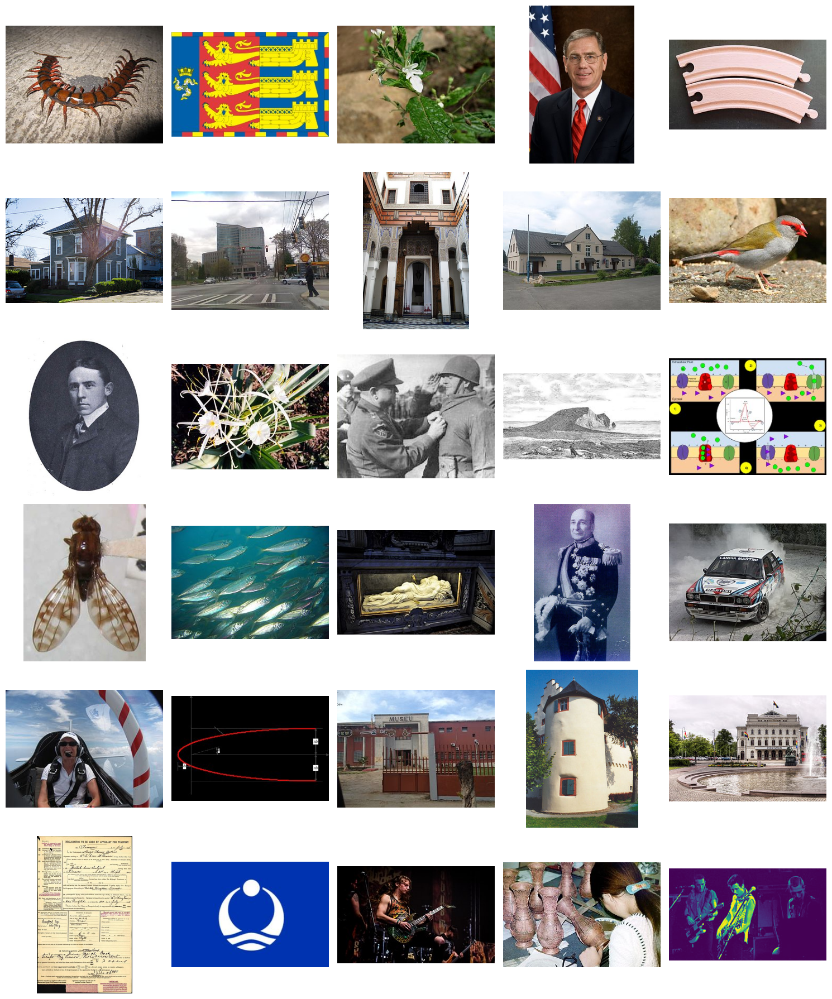

In [14]:
plot_images(df_invalid.head(30)["image"].values)

Some of them are clearly object, some of them model is just uncertain. It is better not to include possible misclassifies in our dataset as it can impact our training performance.

Let's now take a peak at classified images:

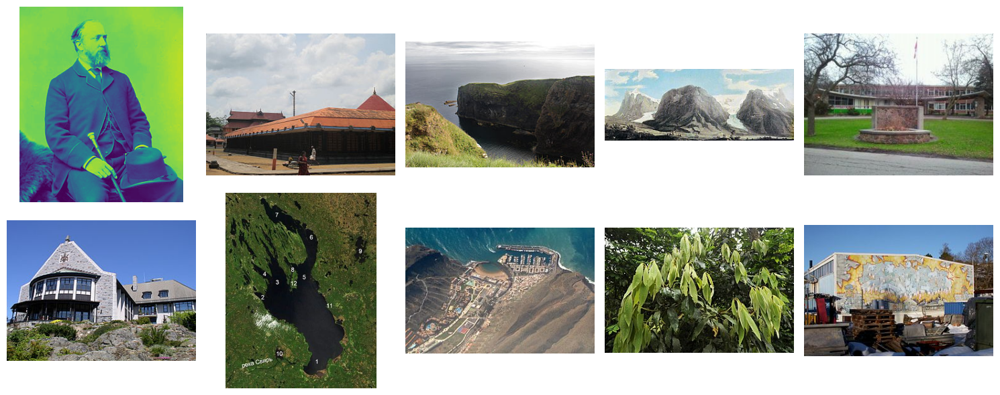

In [15]:
plot_images(df[df["is_outdoor_small"]].head(10)["image"].values)

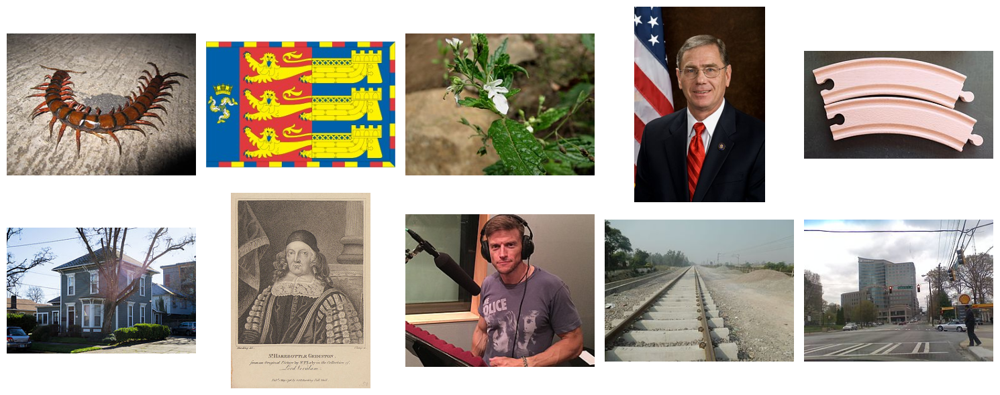

In [16]:
plot_images(df[df["is_outdoor_small"].values == False].head(10)["image"].values)  # noqa: E712

Extremely poor performance for small models. Let's tackle performance on largest model i can fit (and best according to huggingface rankings):

In [ ]:
prepared_dataset_part_large = perform_experiment(
    model="internvl3-8b-instruct",
    experiment_id="internvl3-8b",
    dataset_part=deepcopy(dataset_part),
    return_dataset_part=True,
)

In [18]:
df["is_outdoor_large"] = pd.DataFrame(prepared_dataset_part_large)["is_outdoor"]
df["prediction_large"] = pd.DataFrame(prepared_dataset_part_large)["prediction"]

print(df["is_outdoor_large"].value_counts())
print()
print(df["prediction_large"].value_counts())
print()
print(
    "Large and small disagree:",
    sum(df["is_outdoor_large"] != df["is_outdoor_small"]),
)

is_outdoor_large
True     77
False    63
Name: count, dtype: int64

prediction_large
N    860
1     77
0     63
Name: count, dtype: int64

Large and small disagree: 911


# Indoor outdoor net

In [19]:
model_name = "prithivMLmods/IndoorOutdoorNet"
model = SiglipForImageClassification.from_pretrained(model_name)
processor = AutoImageProcessor.from_pretrained(model_name, use_fast=True)
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
model.to(device)


def classify_environment_image(image_bytes):
    """Predicts whether an image is Indoor or Outdoor using byte input."""
    img = Image.open(io.BytesIO(image_bytes)).convert("RGB")
    inputs = processor(images=img, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}

    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        probs = torch.nn.functional.softmax(logits, dim=1).squeeze().tolist()

    labels = {"0": "Indoor", "1": "Outdoor"}
    predictions = {labels[str(i)]: round(probs[i], 3) for i in range(len(probs))}

    return predictions

In [20]:
predictions = df["image"].apply(lambda x: classify_environment_image(x)["Outdoor"])

df["is_outdoor_online"] = predictions > 0.5
df["prediction_online"] = predictions

In [21]:
df["is_outdoor_online"].value_counts()

is_outdoor_online
True     554
False    446
Name: count, dtype: int64

In [22]:
small_preds = df["is_outdoor_small"].values
online_preds = df["is_outdoor_online"].values
large_preds = df["is_outdoor_large"].values

all_preds_idxs = (
    (~pd.isna(small_preds)) & (~pd.isna(large_preds)) & (~pd.isna(online_preds))
)

online_and_small_disagrees = np.where(
    small_preds[all_preds_idxs] != online_preds[all_preds_idxs]
)[0]
online_and_large_disagrees = np.where(
    large_preds[all_preds_idxs] != online_preds[all_preds_idxs]
)[0]
small_and_large_disagrees = np.where(
    small_preds[all_preds_idxs] != large_preds[all_preds_idxs]
)[0]

all_images = df.loc[all_preds_idxs, "image"].reset_index(drop=True)
all_labels_small = df.loc[all_preds_idxs, "is_outdoor_small"].reset_index(drop=True)
all_labels_large = df.loc[all_preds_idxs, "is_outdoor_large"].reset_index(drop=True)
all_labels_online = df.loc[all_preds_idxs, "is_outdoor_online"].reset_index(drop=True)

print("Online and small disagree:", len(online_and_small_disagrees))
print("Online and large disagree:", len(online_and_large_disagrees))
print("Small and large disagree:", len(small_and_large_disagrees))

Online and small disagree: 71
Online and large disagree: 38
Small and large disagree: 51


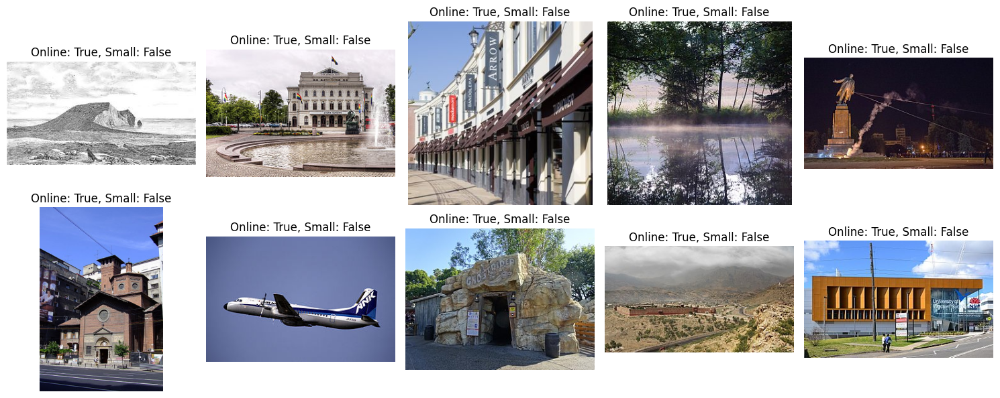

In [23]:
images = all_images[online_and_small_disagrees].head(10).values

labels_online = all_labels_online[online_and_small_disagrees].head(10).values
labels_small = all_labels_small[online_and_small_disagrees].head(10).values
labels = [
    "Online: " + str(label) + ", Small: " + str(label_small)
    for label, label_small in zip(labels_online, labels_small)
]

plot_images(images, labels=labels)

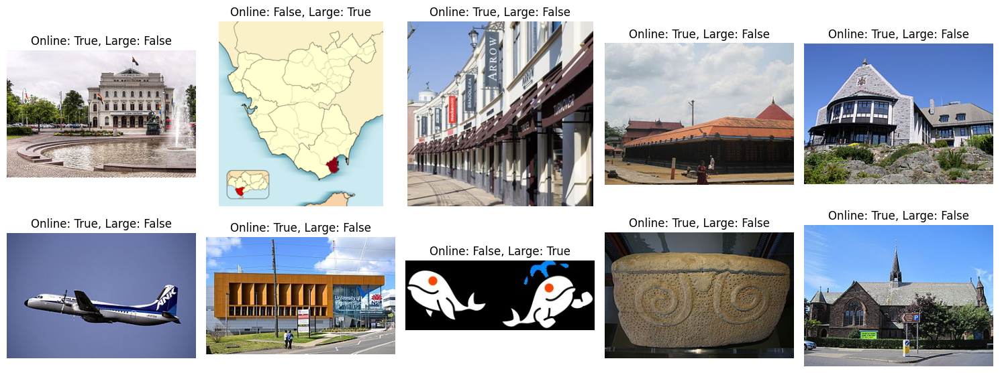

In [24]:
images = all_images[online_and_large_disagrees].head(10).values

labels_online = all_labels_online[online_and_large_disagrees].head(10).values
labels_large = all_labels_large[online_and_large_disagrees].head(10).values
labels = [
    "Online: " + str(label) + ", Large: " + str(label_large)
    for label, label_large in zip(labels_online, labels_large)
]

plot_images(images, labels=labels)

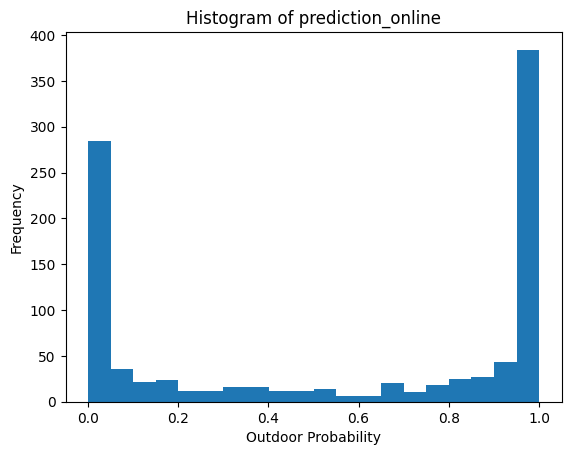

In [25]:
plt.hist(df["prediction_online"], bins=20)
plt.xlabel("Outdoor Probability")
plt.ylabel("Frequency")
plt.title("Histogram of prediction_online")
plt.show()

In [26]:
unsure = df["prediction_online"].apply(lambda x: 0.1 < x < 0.9)

unsure.value_counts()

prediction_online
False    747
True     253
Name: count, dtype: int64

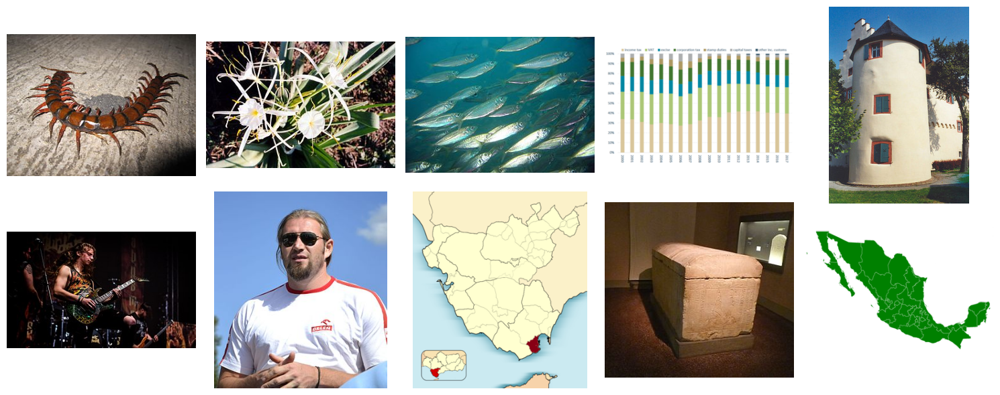

In [27]:
plot_images(df.loc[unsure, "image"].head(10).values)

# Images deduplication

In [28]:
np.array(df["embedding"].values.tolist()).shape

(1000, 2048)

In [ ]:
unique_indices, duplicate_pairs = deduplicate_embeddings(
    np.array(df["embedding"].values.tolist()), return_pairs=True
)

In [30]:
print(
    "Number of unique embeddings:",
    len(unique_indices),
    "out of",
    len(df["embedding"].values.tolist()),
)
print("Number of duplicate pairs:", len(duplicate_pairs))

Number of unique embeddings: 996 out of 1000
Number of duplicate pairs: 10


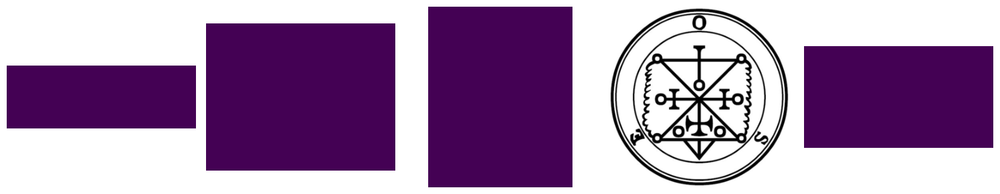

In [31]:
plot_images(
    df.loc[sorted(set(itertools.chain.from_iterable(duplicate_pairs))), "image"].values
)

In [32]:
img_array = np.array(Image.open(io.BytesIO(df.loc[duplicate_pairs[0][0], "image"])))
np.unique(img_array, return_counts=True)

(array([0], dtype=uint8), array([29700]))

# Final thoughts 

Final pipeline will go as follows:

prepare initial set
- download data batch from source
- extract image, embedding 
- remove images that are corrupted, ie length of unique pixel values is smaller than 10
- get images class with indoor outdoor net
- remove images where model confidence is low (ie in (0.1, 0.9)) - risk of mislabelling
- perform images deduplication
- save label, image and embedding

then, on prepared initial set
- perform images deduplication 
- remove embedding to save space 

And this will be used as data for model training and evaluation